In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
os.chdir('/Users/Erin/git/moo_and_mcmc/dream')

In [3]:
traces = {}
for trace in ['a']:
    traces[trace] = [np.load('earm_mtdreamz_3chain_flat_1his_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 3):
        traces[trace].append(np.load('earm_mtdreamz_3chain_flat_1his_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [4]:
logps = {}
for trace in ['a']:
    logps[trace] = [np.load('earm_mtdreamz_3chain_flat_1his_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 3):
        logps[trace].append(np.load('earm_mtdreamz_3chain_flat_1his_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-1874.69951365]
 [-1874.69951365]
 [-1874.69951365]
 [-1874.69951365]
 [-1405.29931557]
 [-1405.29931557]
 [-1405.29931557]
 [-1405.29931557]
 [-1405.29931557]
 [ -666.55568883]
 [ -666.55568883]
 [ -666.55568883]
 [ -666.55568883]
 [ -234.62609361]
 [ -234.62609361]
 [  -95.33769451]
 [  -28.6848565 ]
 [   -8.28676317]
 [   -8.28676317]
 [   -8.28676317]
 [  -10.18988023]
 [  -10.18988023]
 [   92.55386759]
 [   92.55386759]
 [   92.55386759]
 [   92.55386759]
 [   92.55386759]
 [  129.84777777]
 [  129.84777777]
 [  187.84828078]
 [  187.84828078]
 [  284.86246988]
 [  304.00463247]
 [  306.10848424]
 [  306.10848424]
 [  306.10848424]
 [  318.46950626]
 [  318.46950626]
 [  318.46950626]
 [  318.46950626]
 [  318.46950626]
 [  319.29969511]
 [  319.29969511]
 [  319.29969511]
 [  318.43334424]
 [  324.36015566]
 [  324.36015566]
 [  330.35196467]
 [  330.35196467]
 [  330.35196467]
 [  330.35196467]
 [  330.35196467]
 [  330.35196467]
 [  330.3519646

In [5]:
traces['a'][0][:,72]

array([-1.19559375, -1.19559375, -1.19559375, -1.19559375, -1.22082671,
       -1.22082671, -1.22082671, -1.22082671, -1.22082671, -1.32499309,
       -1.32499309, -1.32499309, -1.32499309, -1.32499309, -1.32499309,
       -1.17469857, -1.17780516, -1.17780516, -1.17780516, -1.17780516,
       -1.07926651, -1.07926651, -1.07926651, -1.07926651, -1.07926651,
       -1.07926651, -1.07926651, -1.07926651, -1.07926651, -1.07926651,
       -1.07926651, -1.07926651, -1.00944719, -0.89920524, -0.89920524,
       -0.89920524, -0.97231034, -0.97231034, -0.97231034, -0.97231034,
       -0.97231034, -0.97231034, -0.97231034, -0.97231034, -0.97231034,
       -0.97231034, -0.97231034, -0.97231034, -0.97231034, -0.97231034,
       -0.97231034, -0.97231034, -0.97231034, -0.97231034, -0.97231034,
       -0.97231034, -0.97231034, -0.97231034, -0.98493284, -0.98493284,
       -0.98493284, -0.98493284, -0.98493284, -0.98493284, -0.98493284,
       -0.98493284, -0.98493284, -0.98493284, -0.98493284, -0.97

In [8]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [9]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  18  of  105  parameters.
Percent of parameters with GR below 1.2:  17.1428571429
Number of parameters with GR below 1.1:  8  of  105  parameters.
Percent of parameters with GR below 1.1:  7.61904761905


[18, 17.142857142857142, 8, 7.6190476190476195]

1000
3
1000


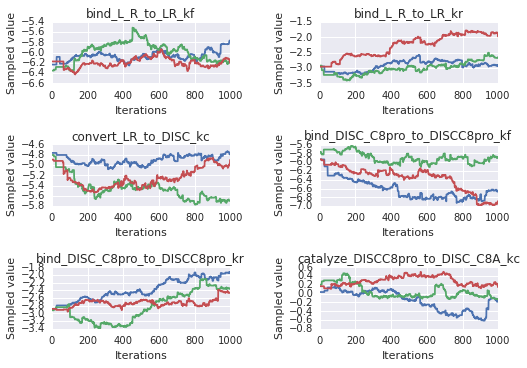

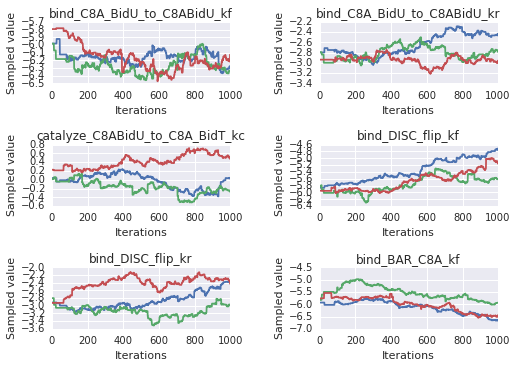

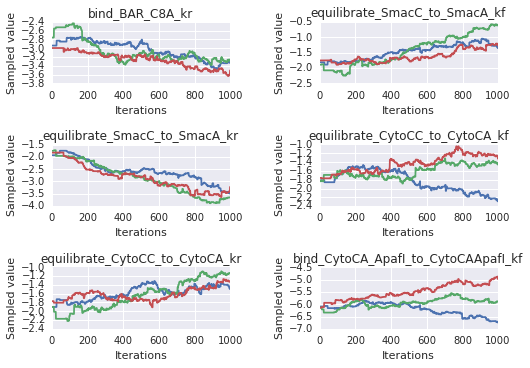

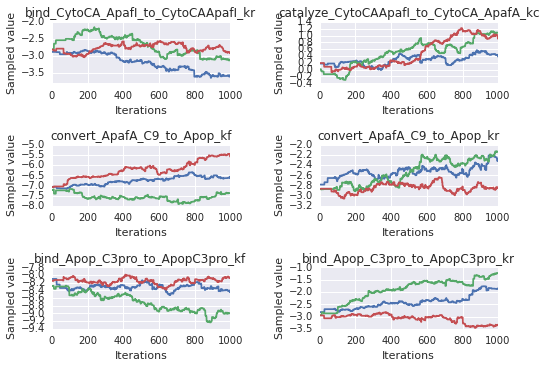

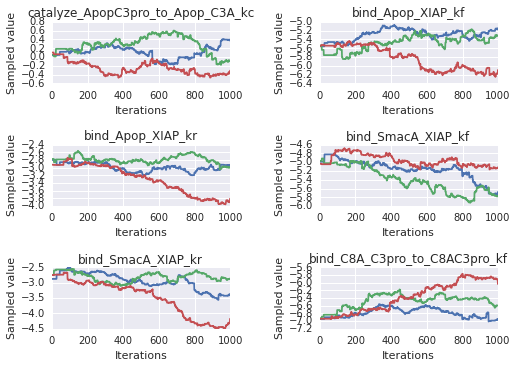

...

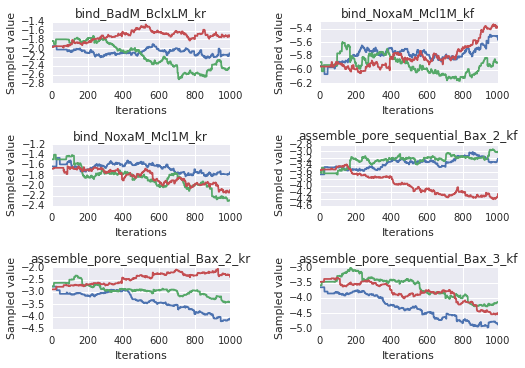

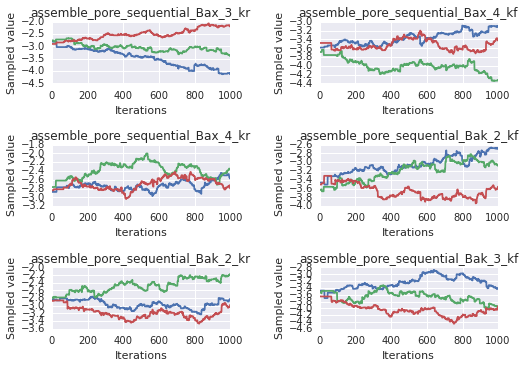

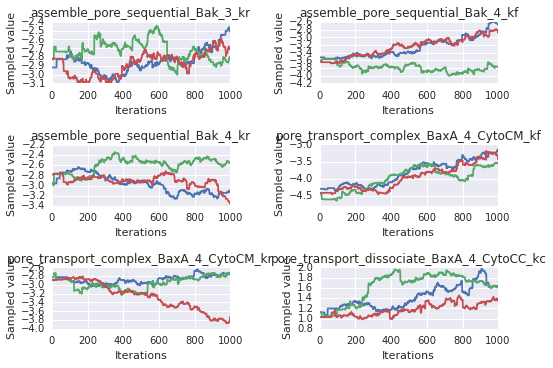

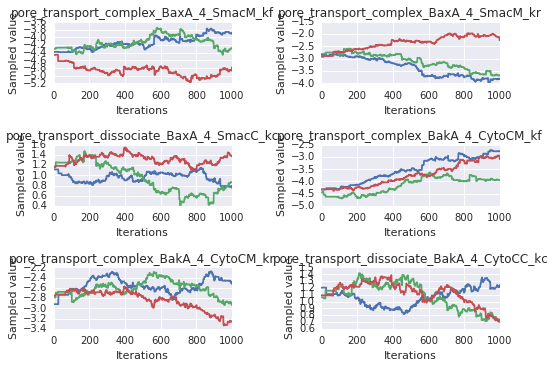

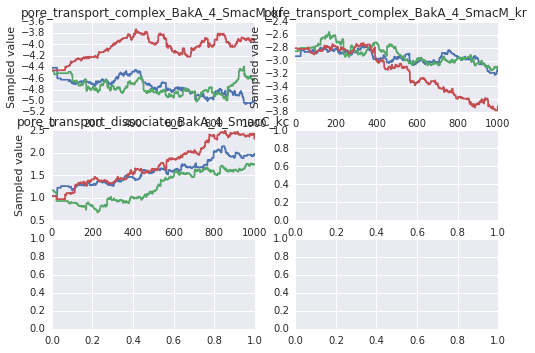

In [10]:
sample_plots(param_trace_dicts['a'])

In [11]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=600, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


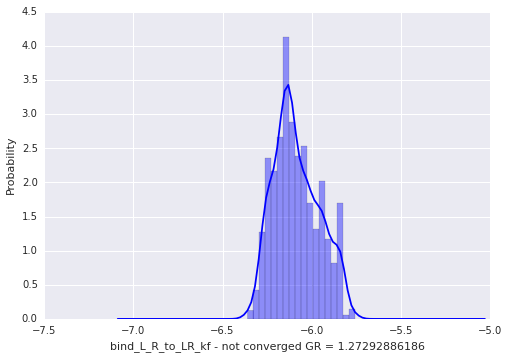

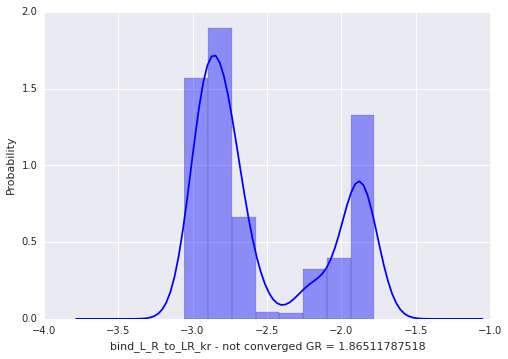

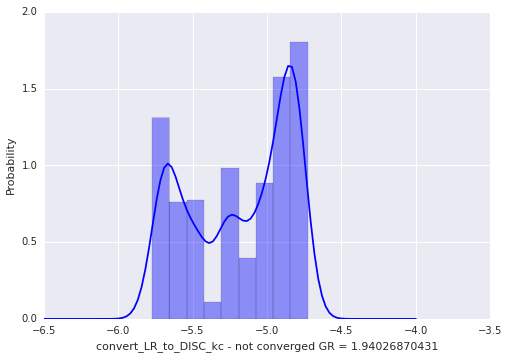

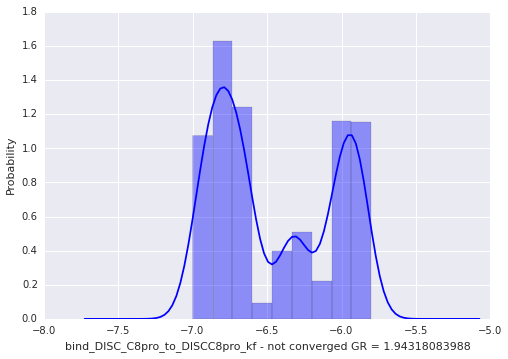

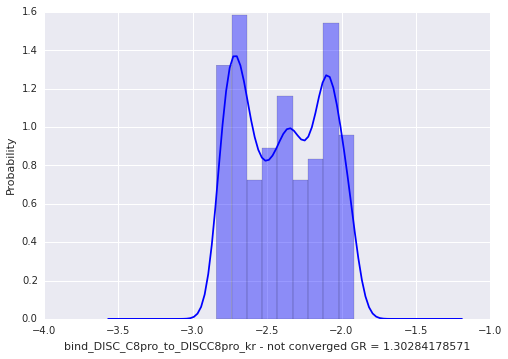

...

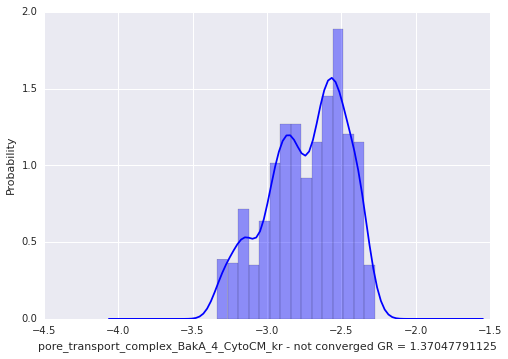

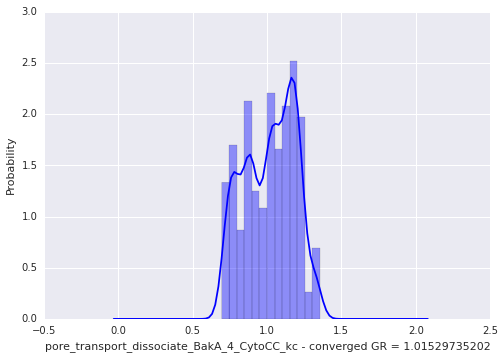

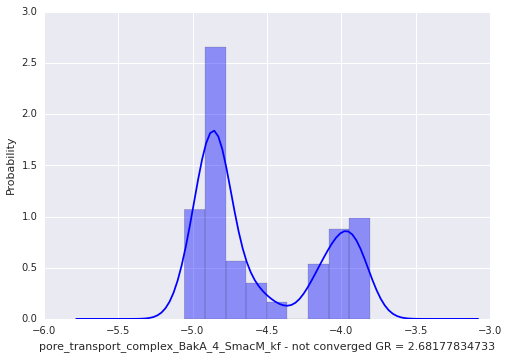

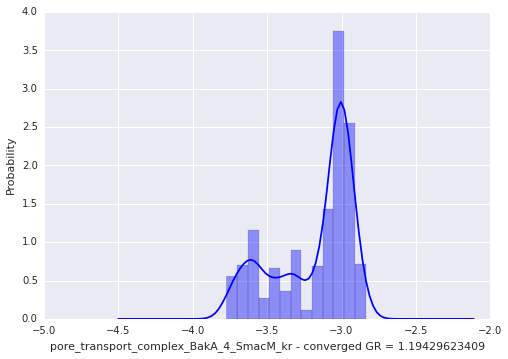

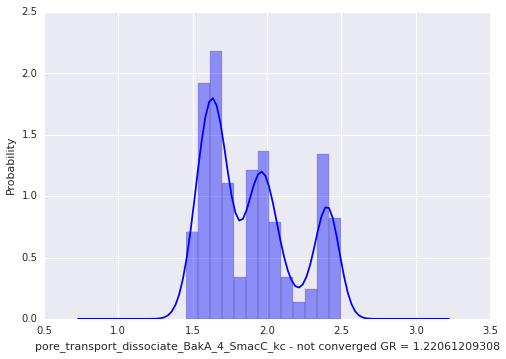

In [12]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [14]:
traces['a'][1][:,0]

array([-6.3521298 , -6.3521298 , -6.3521298 , -6.3521298 , -6.3521298 ,
       -6.3521298 , -6.3521298 , -6.3521298 , -6.3521298 , -6.3521298 ,
       -6.3521298 , -6.3521298 , -6.33240704, -6.33240704, -6.33240704,
       -6.33240704, -6.33240704, -6.33240704, -6.33240704, -6.33240704,
       -6.33240704, -6.33240704, -6.33240704, -6.28064354, -6.28064354,
       -6.28064354, -6.28064354, -6.28064354, -6.28064354, -6.28064354,
       -6.28064354, -6.28064354, -6.28064354, -6.28064354, -6.28064354,
       -6.28064354, -6.28064354, -6.28064354, -6.28064354, -6.28064354,
       -6.28064354, -6.28064354, -6.28064354, -6.28064354, -6.28064354,
       -6.28064354, -6.28064354, -6.28064354, -6.28064354, -6.28064354,
       -6.28064354, -6.28064354, -6.28064354, -6.28064354, -6.28064354,
       -6.28064354, -6.28064354, -6.28064354, -6.28064354, -6.28064354,
       -6.28064354, -6.28064354, -6.28064354, -6.28064354, -6.28064354,
       -6.28064354, -6.28064354, -6.28064354, -6.28064354, -6.28

In [6]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

1000
3
1000


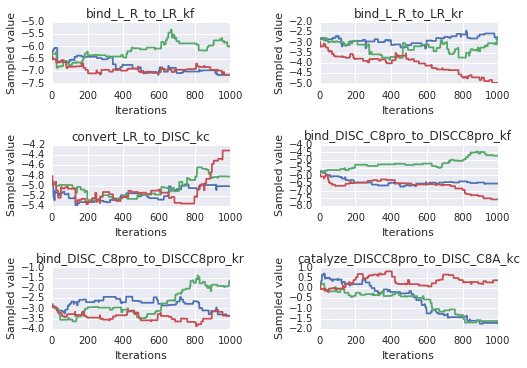

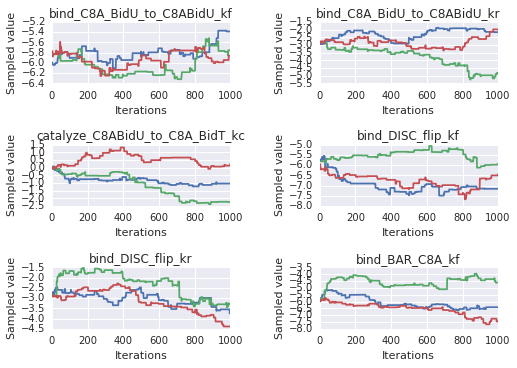

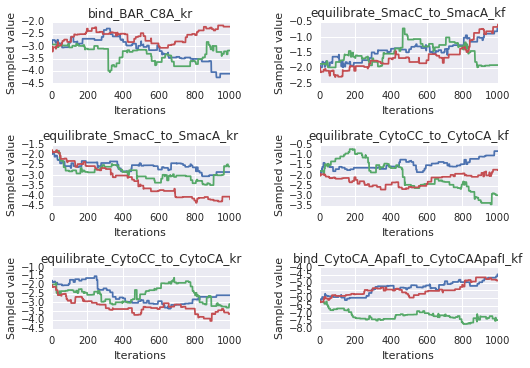

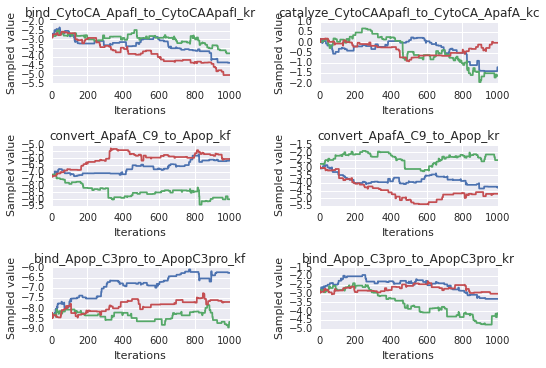

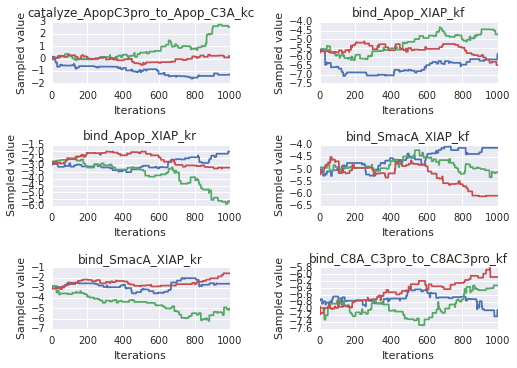

...

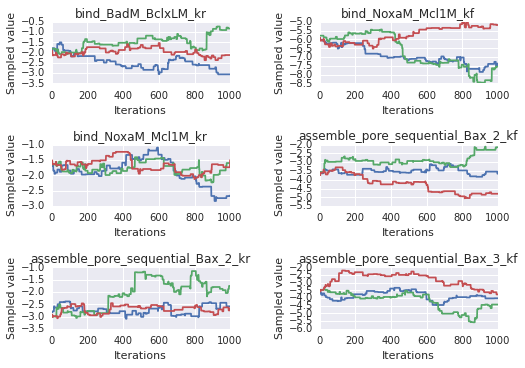

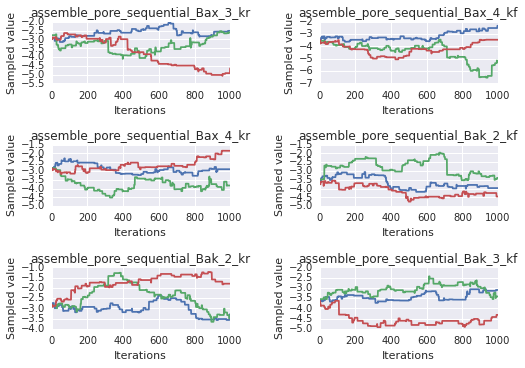

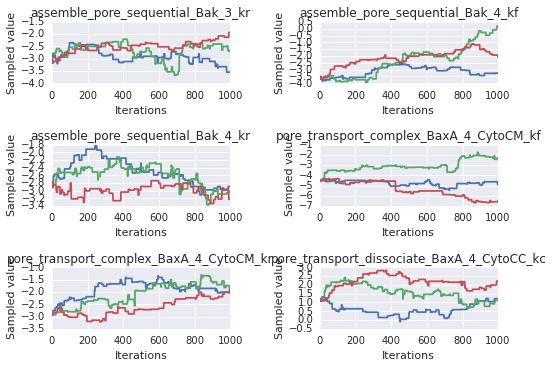

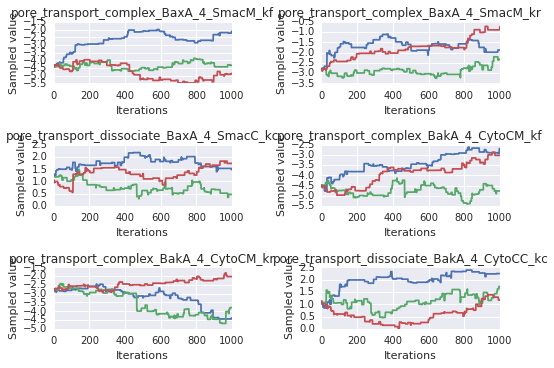

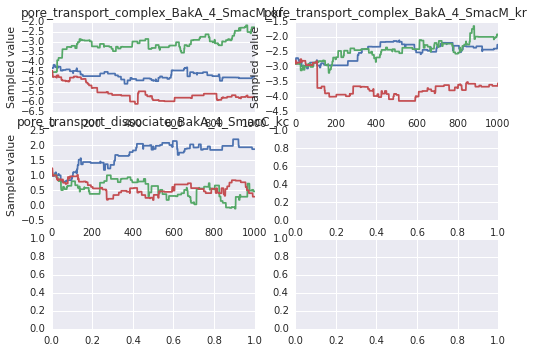

In [7]:
sample_plots(param_trace_dicts['a'])

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


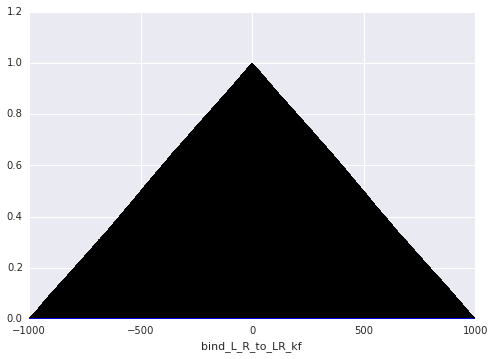

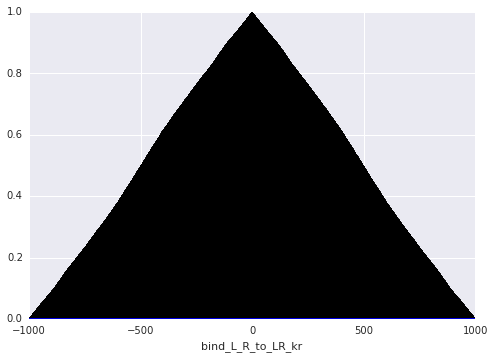

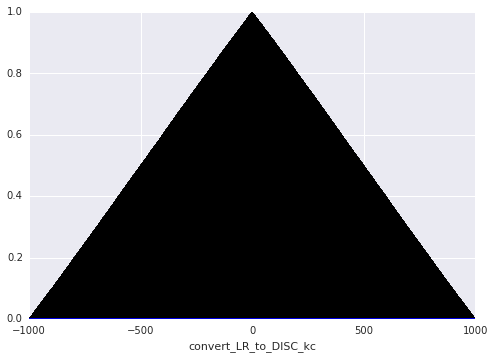

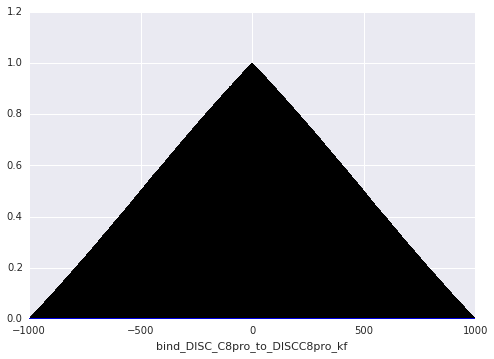

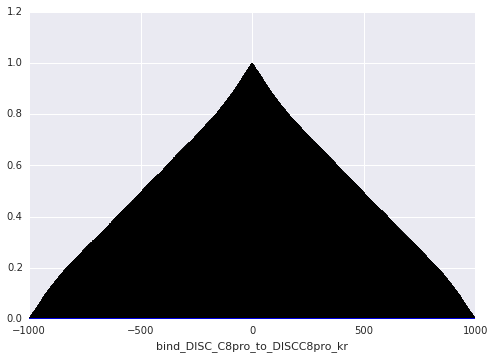

...

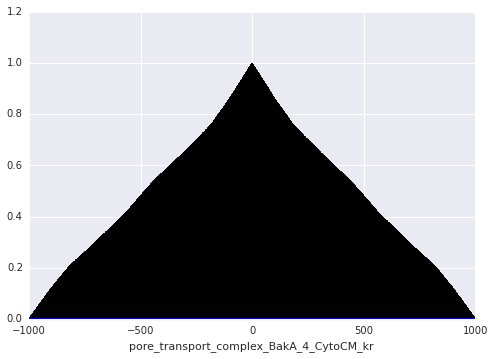

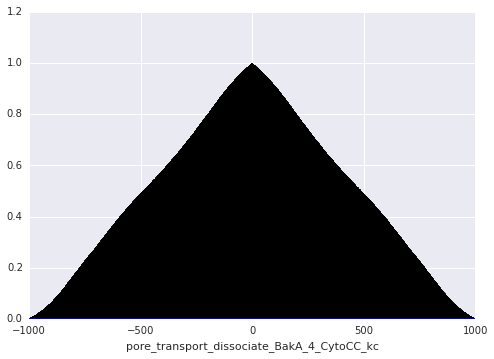

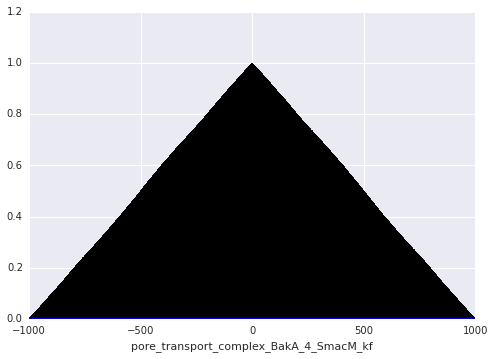

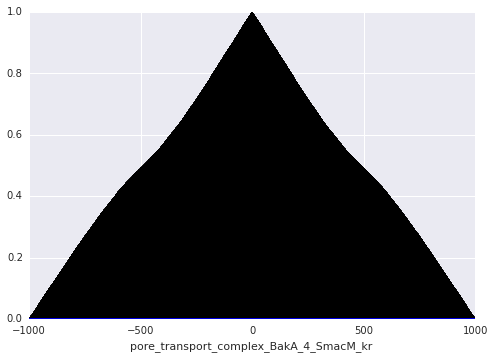

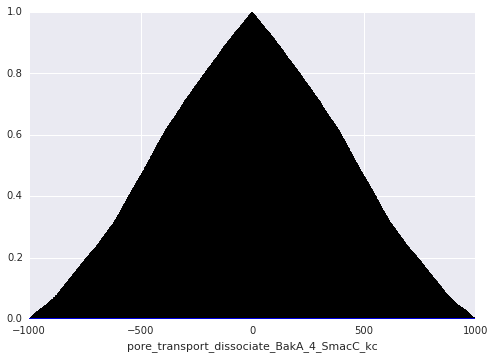

In [8]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

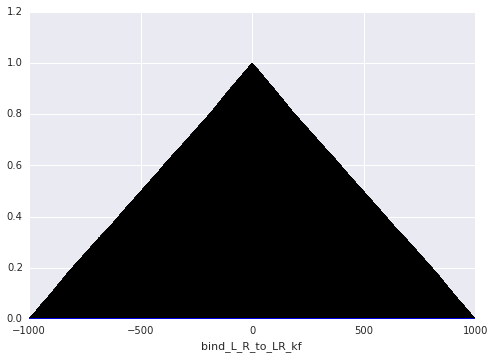

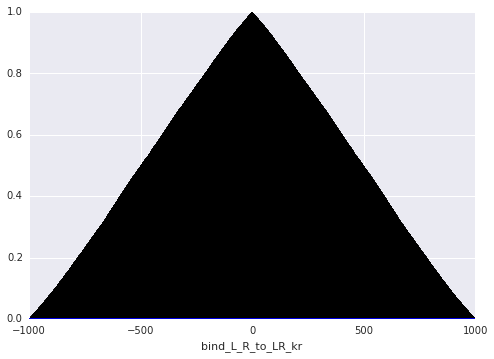

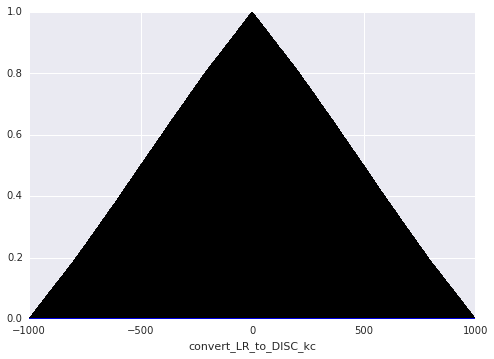

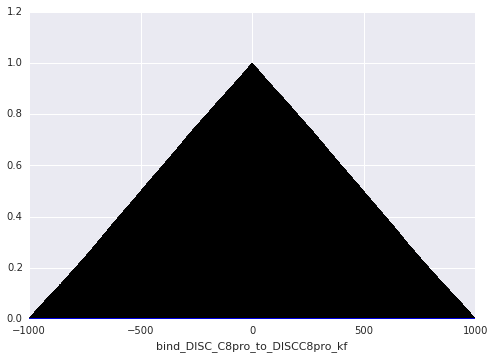

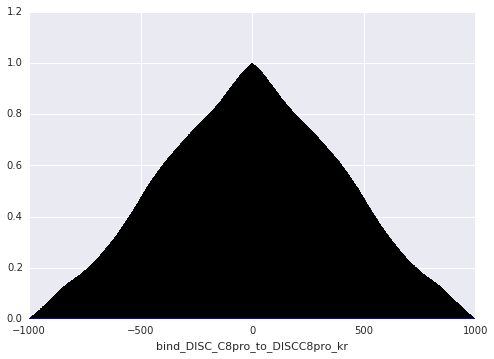

...

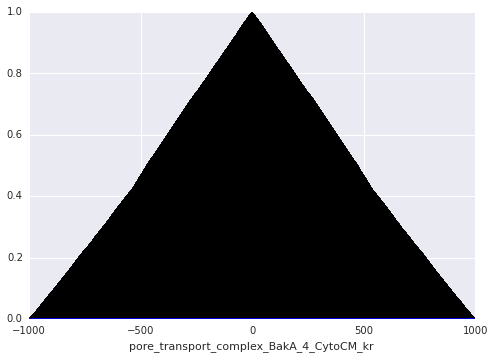

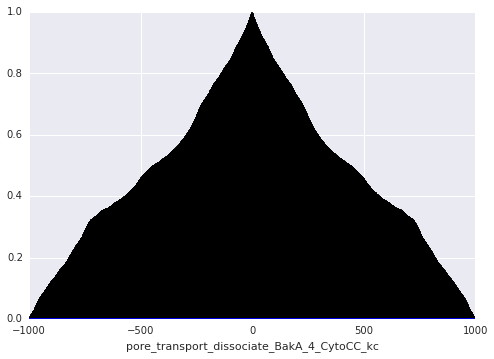

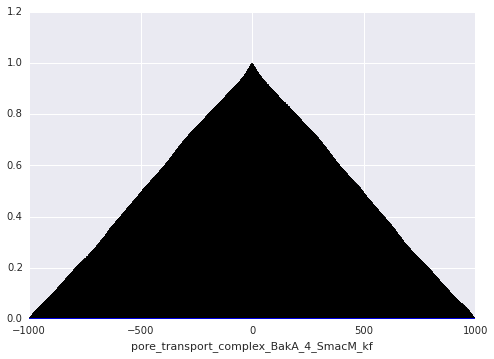

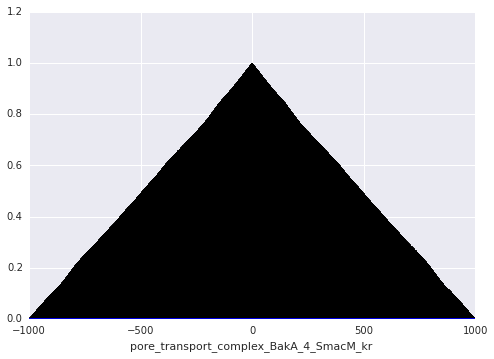

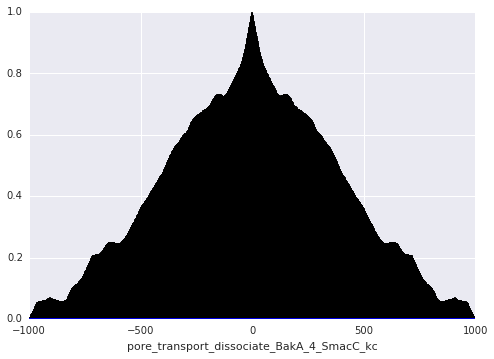

In [9]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][1][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

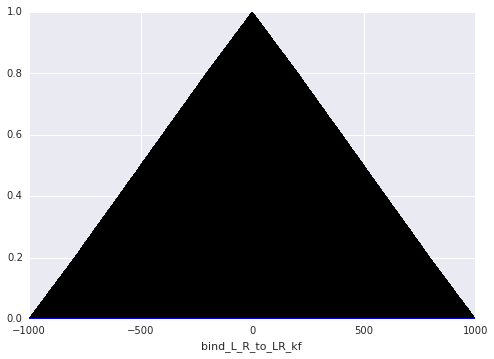

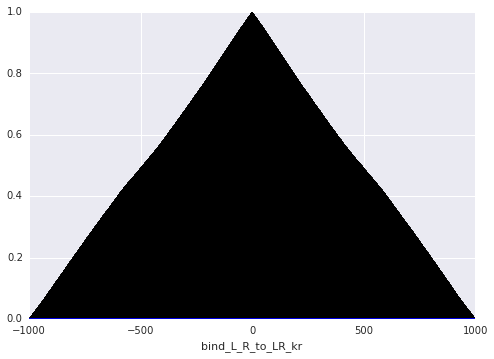

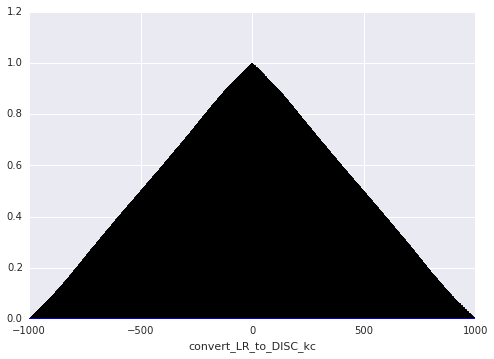

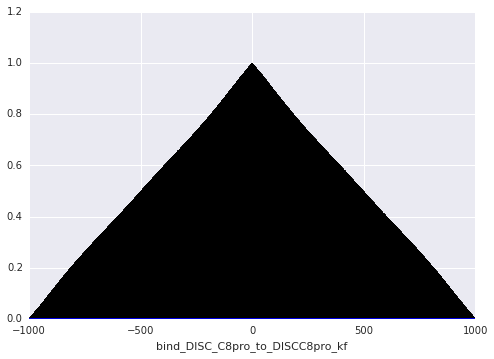

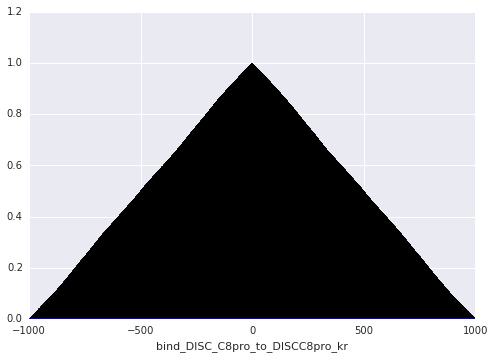

...

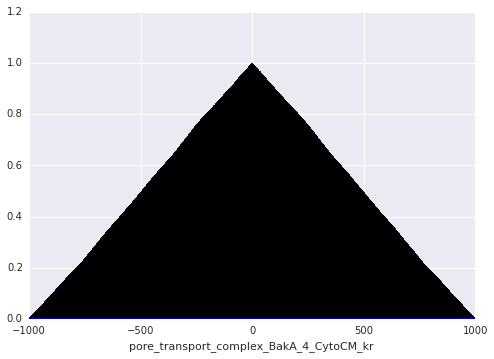

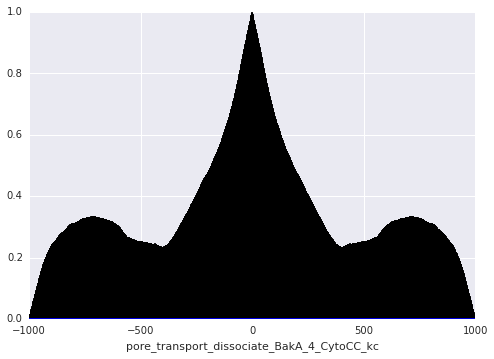

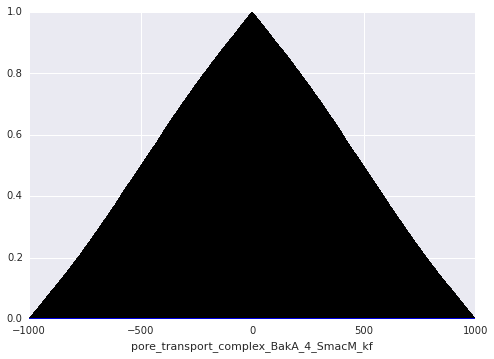

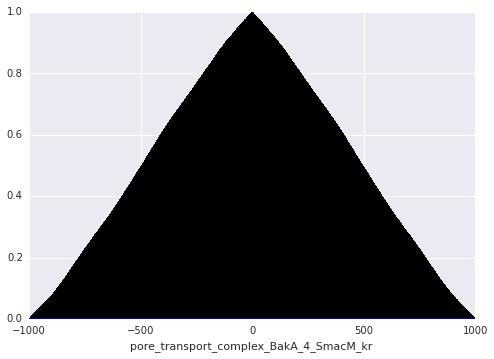

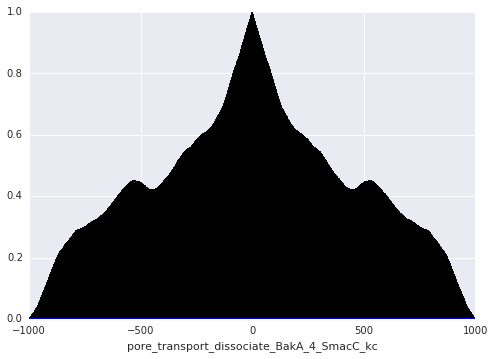

In [10]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][2][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

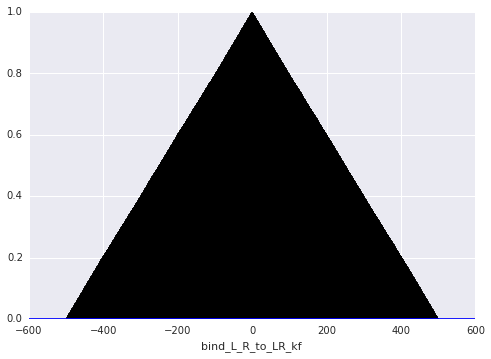

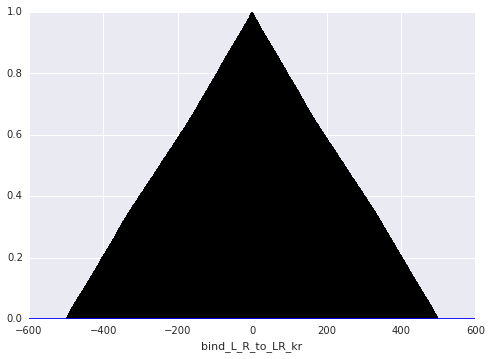

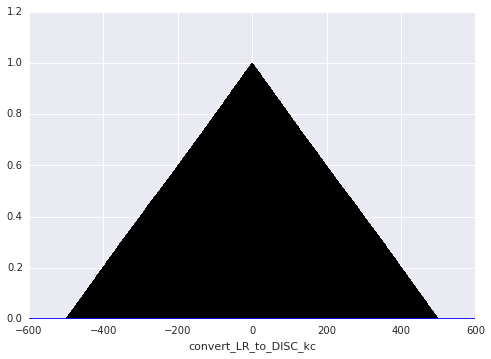

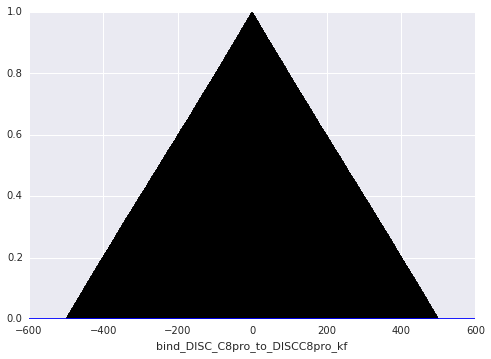

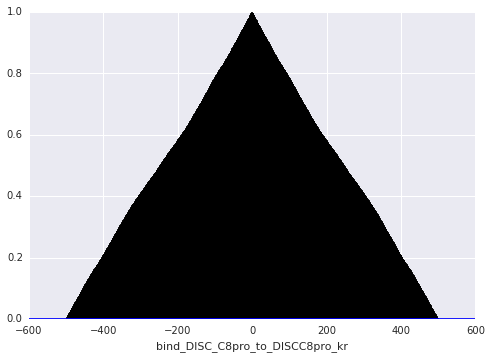

...

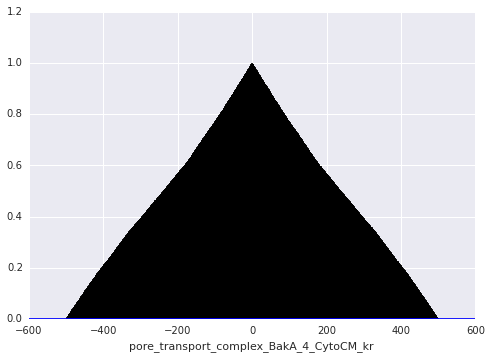

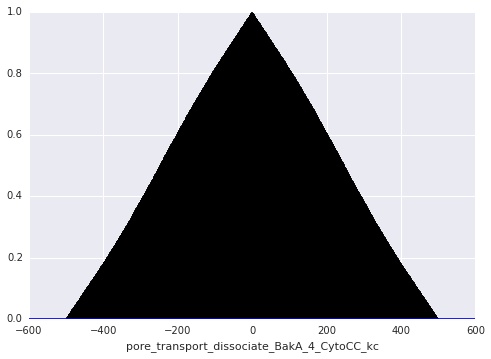

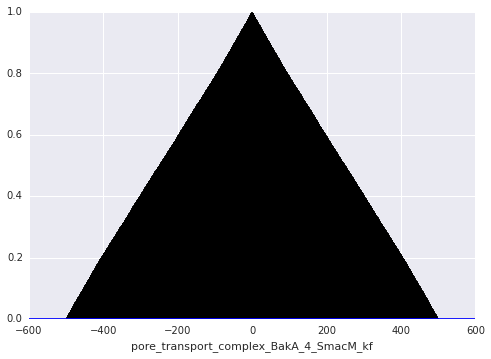

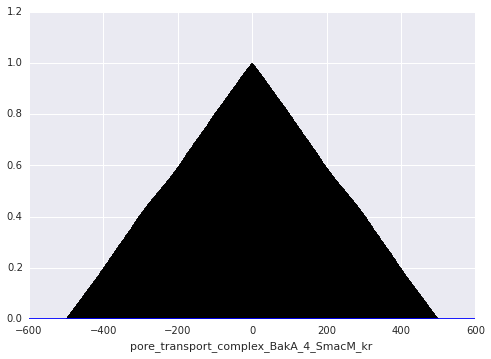

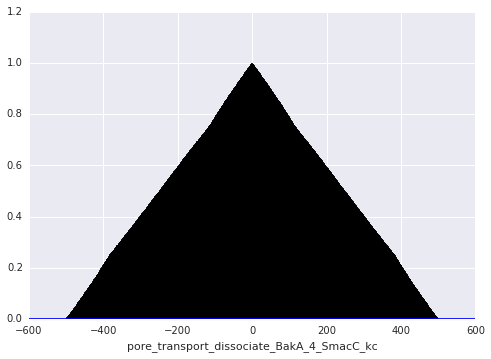

In [11]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][500:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [12]:
acceptance_rates = np.zeros((len(traces['a'][0][0],)))
for dim in range(len(traces['a'][0][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][0])):
        if traces['a'][0][iteration][dim] != traces['a'][0][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  70  acceptance rate:  0.07
N acceptances for parameter:  bind_L_R_to_LR_kr  =  77  acceptance rate:  0.077
N acceptances for parameter:  convert_LR_to_DISC_kc  =  57  acceptance rate:  0.057
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  61  acceptance rate:  0.061
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  79  acceptance rate:  0.079
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  84  acceptance rate:  0.084
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  64  acceptance rate:  0.064
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  70  acceptance rate:  0.07
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  77  acceptance rate:  0.077
N acceptances for parameter:  bind_DISC_flip_kf  =  74  acceptance rate:  0.074
N acceptances for parameter:  bind_DISC_flip_kr  =  78  acceptance rate:  0.078
N acceptances for parameter:  bind_BAR_C

array([ 0.07 ,  0.077,  0.057,  0.061,  0.079,  0.084,  0.064,  0.07 ,
        0.077,  0.074,  0.078,  0.072,  0.078,  0.084,  0.072,  0.067,
        0.066,  0.081,  0.075,  0.074,  0.074,  0.083,  0.078,  0.078,
        0.077,  0.076,  0.069,  0.073,  0.078,  0.07 ,  0.07 ,  0.071,
        0.075,  0.067,  0.076,  0.076,  0.078,  0.079,  0.075,  0.084,
        0.072,  0.061,  0.077,  0.07 ,  0.074,  0.068,  0.081,  0.069,
        0.075,  0.089,  0.08 ,  0.078,  0.074,  0.068,  0.087,  0.058,
        0.075,  0.077,  0.067,  0.086,  0.078,  0.074,  0.085,  0.063,
        0.087,  0.08 ,  0.077,  0.079,  0.075,  0.074,  0.073,  0.075,
        0.082,  0.071,  0.083,  0.091,  0.076,  0.09 ,  0.074,  0.081,
        0.076,  0.074,  0.066,  0.072,  0.083,  0.088,  0.08 ,  0.075,
        0.077,  0.074,  0.079,  0.069,  0.072,  0.08 ,  0.081,  0.074,
        0.067,  0.081,  0.073,  0.077,  0.08 ,  0.067,  0.078,  0.071,
        0.076])

In [13]:
acceptance_rates = np.zeros((len(traces['a'][1][0],)))
for dim in range(len(traces['a'][1][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][1])):
        if traces['a'][1][iteration][dim] != traces['a'][1][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  80  acceptance rate:  0.08
N acceptances for parameter:  bind_L_R_to_LR_kr  =  89  acceptance rate:  0.089
N acceptances for parameter:  convert_LR_to_DISC_kc  =  55  acceptance rate:  0.055
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  63  acceptance rate:  0.063
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  85  acceptance rate:  0.085
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  66  acceptance rate:  0.066
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  68  acceptance rate:  0.068
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  88  acceptance rate:  0.088
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  68  acceptance rate:  0.068
N acceptances for parameter:  bind_DISC_flip_kf  =  65  acceptance rate:  0.065
N acceptances for parameter:  bind_DISC_flip_kr  =  92  acceptance rate:  0.092
N acceptances for parameter:  bind_BAR_

array([ 0.08 ,  0.089,  0.055,  0.063,  0.085,  0.066,  0.068,  0.088,
        0.068,  0.065,  0.092,  0.082,  0.08 ,  0.089,  0.085,  0.092,
        0.095,  0.1  ,  0.094,  0.1  ,  0.082,  0.104,  0.073,  0.099,
        0.096,  0.091,  0.085,  0.087,  0.097,  0.087,  0.095,  0.097,
        0.09 ,  0.088,  0.101,  0.085,  0.087,  0.095,  0.082,  0.09 ,
        0.102,  0.077,  0.09 ,  0.088,  0.096,  0.091,  0.092,  0.091,
        0.103,  0.097,  0.094,  0.108,  0.077,  0.078,  0.093,  0.093,
        0.094,  0.096,  0.084,  0.093,  0.095,  0.083,  0.101,  0.095,
        0.092,  0.09 ,  0.086,  0.092,  0.093,  0.088,  0.09 ,  0.097,
        0.096,  0.095,  0.085,  0.088,  0.094,  0.088,  0.083,  0.093,
        0.084,  0.075,  0.091,  0.092,  0.096,  0.1  ,  0.1  ,  0.088,
        0.095,  0.096,  0.086,  0.1  ,  0.102,  0.089,  0.085,  0.103,
        0.095,  0.09 ,  0.083,  0.1  ,  0.096,  0.101,  0.094,  0.094,
        0.092])

In [14]:
acceptance_rates = np.zeros((len(traces['a'][2][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][2])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  61  acceptance rate:  0.061
N acceptances for parameter:  bind_L_R_to_LR_kr  =  73  acceptance rate:  0.073
N acceptances for parameter:  convert_LR_to_DISC_kc  =  65  acceptance rate:  0.065
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  60  acceptance rate:  0.06
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  72  acceptance rate:  0.072
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  85  acceptance rate:  0.085
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  64  acceptance rate:  0.064
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  81  acceptance rate:  0.081
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  69  acceptance rate:  0.069
N acceptances for parameter:  bind_DISC_flip_kf  =  64  acceptance rate:  0.064
N acceptances for parameter:  bind_DISC_flip_kr  =  70  acceptance rate:  0.07
N acceptances for parameter:  bind_BAR_C

array([ 0.061,  0.073,  0.065,  0.06 ,  0.072,  0.085,  0.064,  0.081,
        0.069,  0.064,  0.07 ,  0.075,  0.078,  0.074,  0.073,  0.07 ,
        0.073,  0.069,  0.082,  0.069,  0.081,  0.073,  0.08 ,  0.068,
        0.078,  0.079,  0.073,  0.074,  0.073,  0.072,  0.076,  0.076,
        0.063,  0.087,  0.075,  0.075,  0.065,  0.08 ,  0.073,  0.077,
        0.065,  0.07 ,  0.074,  0.071,  0.076,  0.068,  0.069,  0.076,
        0.064,  0.068,  0.062,  0.074,  0.067,  0.073,  0.079,  0.076,
        0.072,  0.075,  0.072,  0.077,  0.066,  0.073,  0.069,  0.069,
        0.07 ,  0.076,  0.079,  0.074,  0.073,  0.076,  0.075,  0.071,
        0.085,  0.075,  0.077,  0.071,  0.067,  0.062,  0.076,  0.077,
        0.07 ,  0.074,  0.072,  0.073,  0.071,  0.068,  0.078,  0.079,
        0.066,  0.069,  0.066,  0.077,  0.073,  0.071,  0.062,  0.077,
        0.078,  0.064,  0.069,  0.074,  0.071,  0.073,  0.068,  0.078,
        0.078])